# Extended Data Figure 8

![title](../assets/EDFig8.png)

In [6]:
%load_ext autoreload
%autoreload 2
import sys
import logging
from tqdm import tqdm
from pathlib import Path

sys.path.insert(0, "./prepare_data/")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import Figure4_neurons as neurons
import connectome_utils
from common import *

# import plot_utils

DATA_PATH = Path(
    "../data"
)
EXPORT_PATH = Path(
    "../results/EDFigure8"
)
EXPORT_PATH.mkdir(exist_ok=True, parents=True)


FIGSIZE = {'width': 1.2, 'length': 0.9}

# disable matplotlib logger
logging.getLogger("matplotlib.font_manager").disabled = True

plt.style.use('./config.mplstyle')

module_colors = {
    "jo_f": "#D45B83",
    "jo_e": "#D45B83",
    "jo_c": "#D45B83",
    "bm_ant": "#D45B83",
    "central": "#C3B5D9",
    "anten_prem": "#C2DFA0",
    "neck_prem": "#59BAD6",
    "leg_prem": "#E9A686",
    "shared_prem": "#CFCFCE",
    "anten_mn": "#798963",
    "neck_mn": "#356D7A",
}

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
def get_node_pos_vertical(data, max_items_per_column=38):
    """Get node positions in a graph. Each module will be ordered vertically."""
    pos_dictionary = {}
    x_position = 0.0  # Starting x position

    # Iterate through each key in the dictionary
    for key, values in data.items():
        if len(values) > max_items_per_column:
            # Split the values into multiple columns if they exceed max_items_per_column
            for i in range(0, len(values), max_items_per_column):
                sub_values = values[i : i + max_items_per_column]
                midpoint = len(sub_values) / 2
                for j, sub_value in enumerate(sub_values):
                    pos_dictionary[sub_value] = (
                        x_position,
                        sub_values.index(sub_value) - midpoint,
                    )
                x_position += 0.4  # Increment x position for the new column
        else:
            midpoint = len(values) / 2
            for j, value in enumerate(values):
                pos_dictionary[value] = (x_position, values.index(value) - midpoint)

        x_position += 0.6  # Increment x position for the next key

    return pos_dictionary

In [8]:
motor_module_neurons = load_data(DATA_PATH / "Fig4_motor_module_neurons.pkl")
connectivity_motor_modules_clean = load_data(DATA_PATH / "EDFig8_connections.pkl")

motor_module_neuron_dict = {}
for group, ids in motor_module_neurons.items():
    if group[:2] == "bm" or group == "jo_e" or group == "jo_c":
        continue

    for id_n in ids:
        motor_module_neuron_dict[id_n] = {
            "color": module_colors[group],
            "name": neurons.ALL_NEURONS_REV_JO[id_n]['name'],
        }

motor_module_neurons_ordered = {
    name: motor_module_neurons[name]
    for name in [
        "jo_f",
        "central",
        "shared_prem",
        "anten_prem",
        "neck_prem",
        "leg_prem",
        "anten_mn",
        "neck_mn",
    ]
}

### Plot the connectivity among different neuron groups in the model.

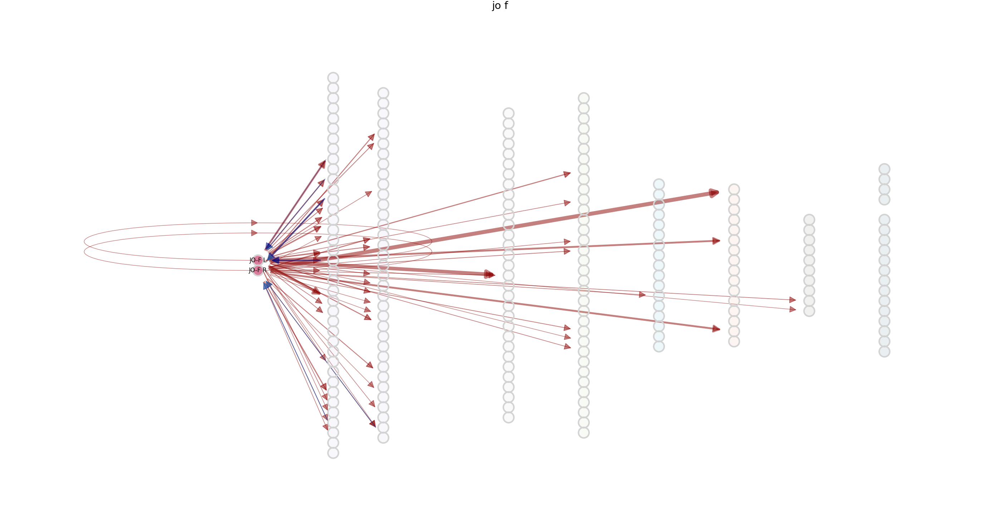

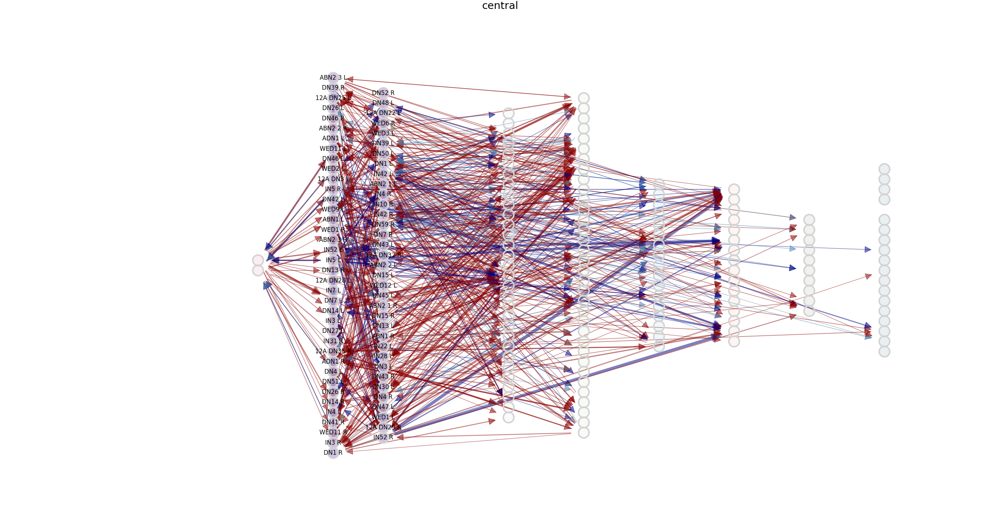

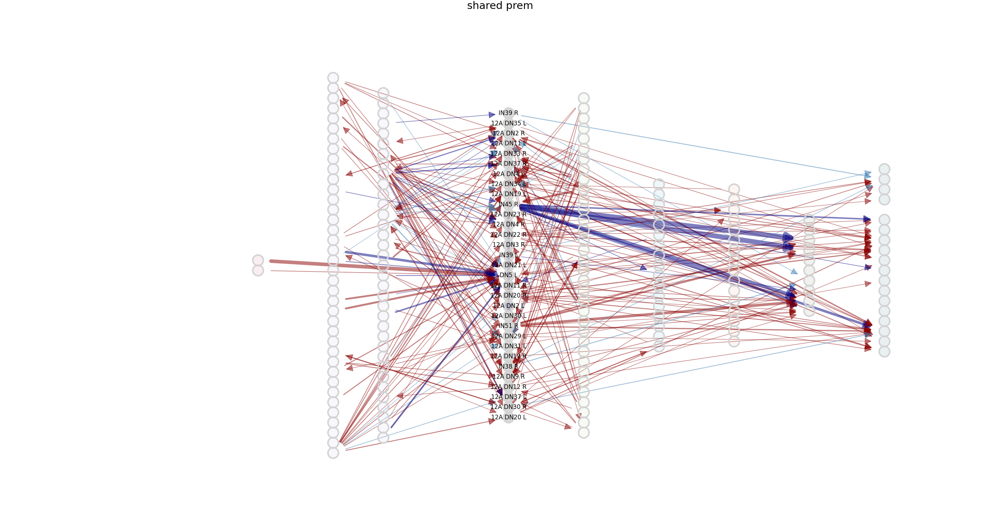

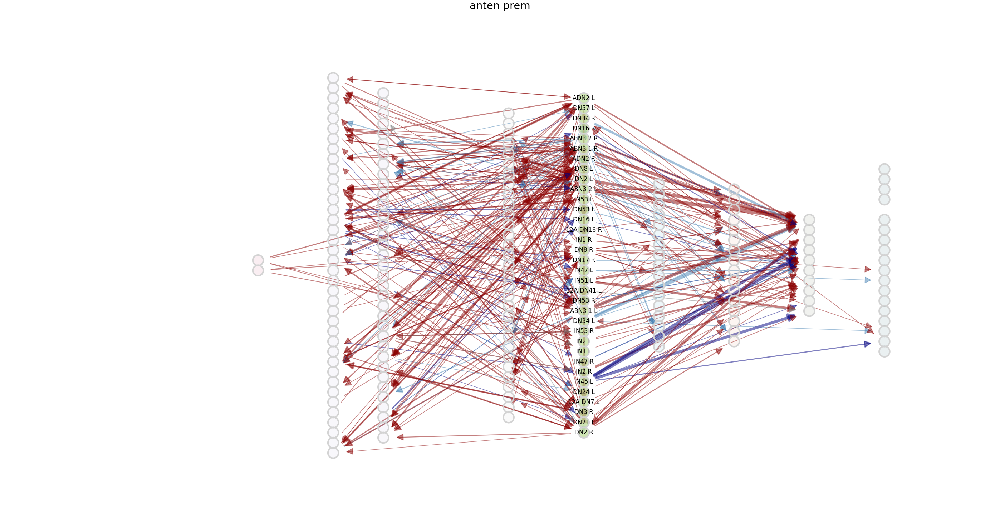

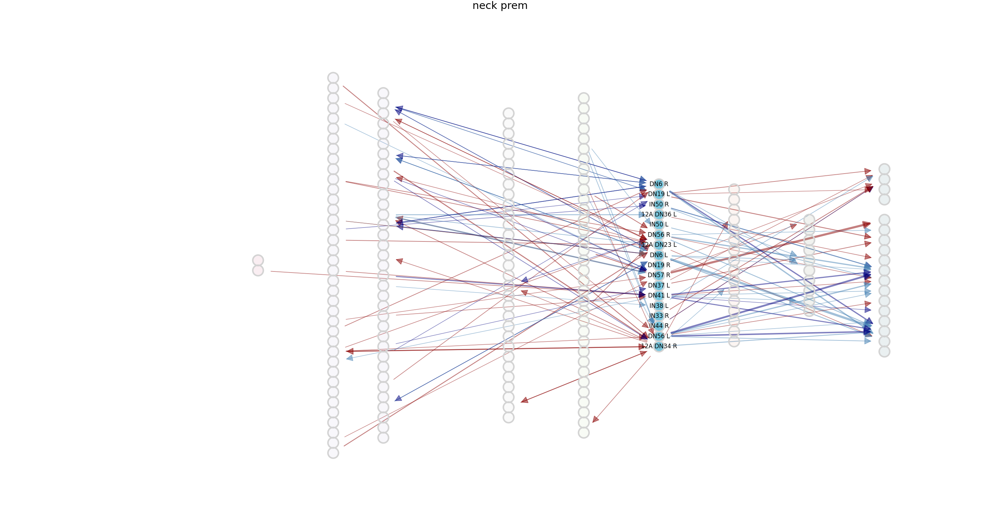

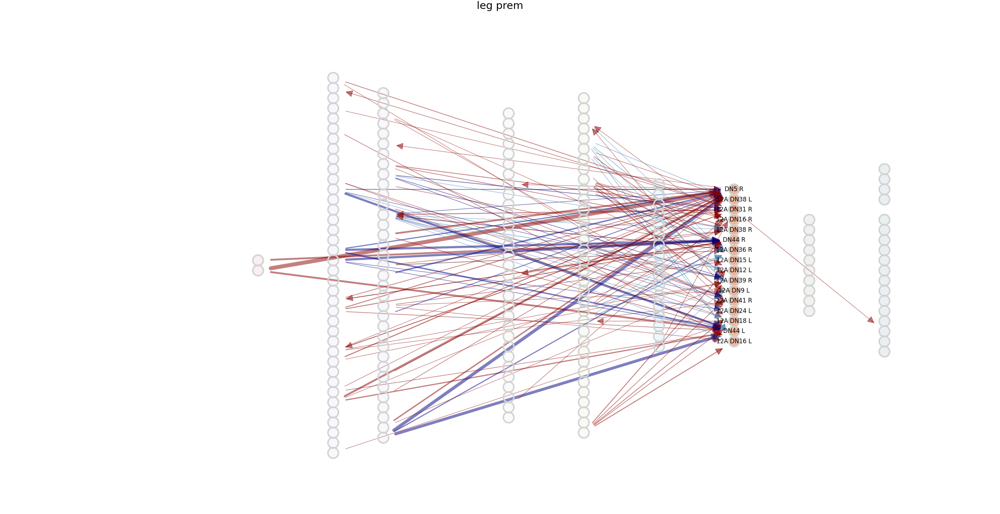

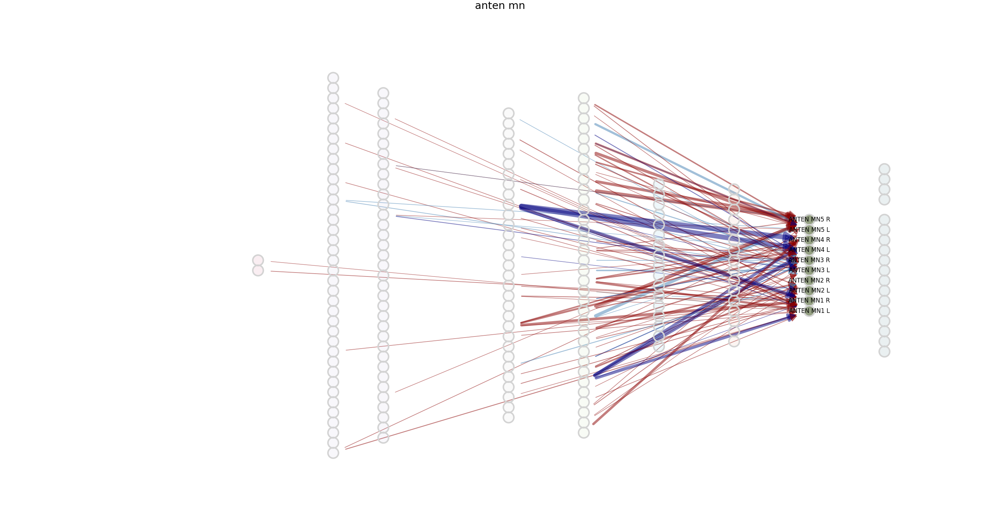

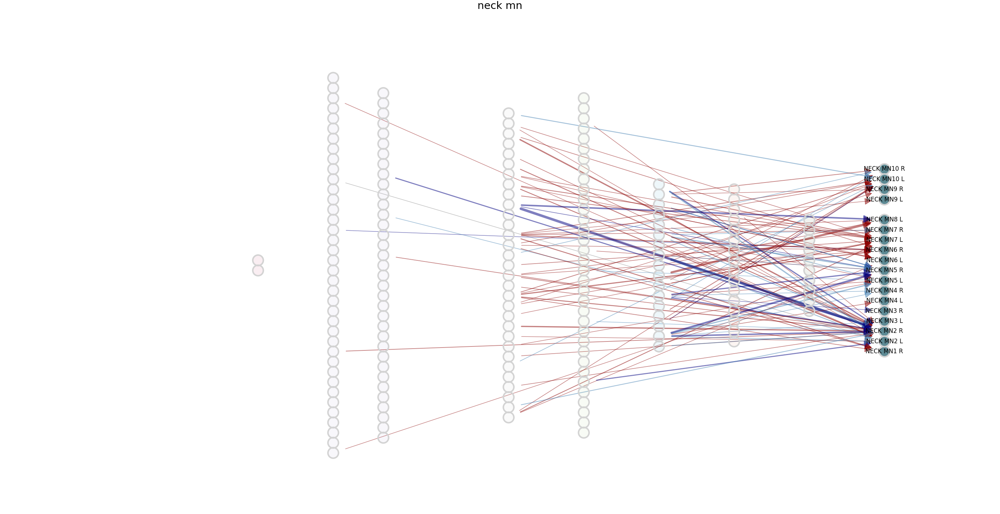

In [9]:
for neuron_group in motor_module_neurons_ordered:
    fig, ax = plt.subplots(figsize=(12,6), dpi=300)

    network_specs_mm, G_clean_mm = connectome_utils.plot_connectivity(
        connectivity_df=connectivity_motor_modules_clean,
        neurons_of_interest=motor_module_neuron_dict,
        pos=get_node_pos_vertical(motor_module_neurons_ordered),
        ax=ax,
        node_size=50,
        font_size=4,
        max_w=3,
        highlight_neuron=motor_module_neurons_ordered[neuron_group],
        export_path=EXPORT_PATH / f"EDFig8_connections_of_{neuron_group}.png",
        title=neuron_group.replace('_',' ')
    )
    plt.show()
